In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from saxs_data_processing import io, manipulate, target_comparison, subtract, sasview_fitting
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd

## User parameter setup

List of all background files to use. Data loading function will find associated data files in the same directory as backgrounds.

In [4]:
background_fps = ['/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03210_B9-T1_Ethanol_background__000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_07_randomcampaignV3/data/03218_D1-T1_Ethanol_background_1_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_11_randomV3_round2/03289_H6-T2_EtOH_background_1_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_17_randomBaselineV4/data/03439_C1-T2_EtOH_1_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_12_10_OptimizationCompareRound1/03734_D5-T2_Ethanol_background_1_000.dat']

Select q ranges. Right now this relies on manual q range selection to a certain extent. We subtract background and fit the spline on a larger q-range, then evaluate the spline on a subset of the larger q range to avoid spline edge effects.

In [5]:
# q range to consider up to and including spline fit step
q_min_subtract = 0.002
q_max_subtract = 0.035

# q range to interpolate spline fit on and perform distance metric calculation with
q_min_spl = 0.003
q_max_spl = 0.03
n_interpolate_gridpts = 1001 # number of grid points to interpolate q on.

Select target particle parameters. Target is spherical particles with radius r and polydispersity pdi

In [6]:
target_r_nm = 60
target_r_angs = target_r_nm*10
target_pdi = 0.08
sld_silica = 8.575
sld_etoh = 9.611

Set processing and optimization parameters for distance calculation

In [7]:
# SavGol denoise filter parameters
savgol_n = 15
savgol_order = 3
# minimum data length - data with less than ~100 data points is due to valid data selection step in subtraction and is likley too noisy to do anything with.
min_data_len = 100

# spline fit parameters
s = 0.05
k = 3

#scale parameters
n_avg = 100

# Amplitude-phase distance parameters
optim = "DP"
grid_dim = 10

## ######################## STOP: Don't touch anything below here \#############################


## Load data

In [8]:
sample_data, uuid2bkg, data_fps = io.load_biocube_data_with_background(background_fps, 24)

In [9]:
data_fps

{'4bec4e18-80bb-44d9-8508-cc464f14b287': '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03174_A1-T1_4bec4e18-80bb-44d9-8508-cc464f14b287_000.dat',
 'a180d359-a229-4b3e-a615-2991fd549f42': '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03176_A2-T1_a180d359-a229-4b3e-a615-2991fd549f42_000.dat',
 '3584700a-8b01-4e59-a53a-1300fd3fac0a': '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03178_A3-T1_3584700a-8b01-4e59-a53a-1300fd3fac0a_000.dat',
 '0e6edb88-77c3-4984-a38d-198341bba9e1': '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03180_A4-T1_0e6edb88-77c3-4984-a38d-198341bba9e1_000.dat',
 '68831f53-4a51-4f12-b385-10c50c8fab46': '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/202

In [10]:
len(data_fps)

122

## Calculate target scattering

In [11]:
q_grid = np.linspace(np.log10(q_min_spl), np.log10(q_max_spl), n_interpolate_gridpts)

q_grid_nonlog = 10**q_grid
target_I = target_comparison.target_intensities(q_grid_nonlog, target_r_angs, target_pdi, sld_silica, sld_etoh)
target_I = np.log10(target_I)

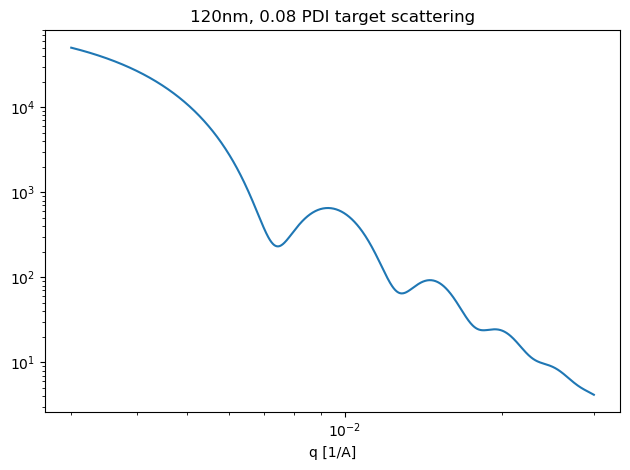

In [12]:
fig, ax = plt.subplots()
ax.loglog(10**q_grid, 10**target_I)
ax.set_xlabel('q [1/A]')
ax.set_title('120nm, 0.08 PDI target scattering')
plt.tight_layout()
plt.savefig('target_profile_120nm.png', dpi = 300)

## Run full processing pipeline

In [13]:
processing_dataset = {}
counter = 0
for uuid_val, data_val in sample_data.items():
    print(f'{counter}: {uuid_val}')
    counter += 1
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = 'valid'
            processing_dataset[uuid_val] = meas_entry


    # 2. Convert everything into log10 space
    q_log = np.log10(subtracted['q'].to_numpy())
    I_log = np.log10(subtracted['I'].to_numpy())

    meas_entry['q_log'] = q_log
    meas_entry['I_log'] = I_log
    
    # 3. denoise filter on intensity
    
    I_savgol = manipulate.denoise_intensity(I_log, savgol_n = savgol_n, savgol_order = savgol_order)

    meas_entry['I_savgol'] = I_savgol

    # 4. Spline fit and interpolate
    I_spline = manipulate.fit_interpolate_spline(q_log, I_savgol, q_grid, s = s, k = k)
    
    meas_entry['I_spline'] = I_spline

    # 5. scale onto target
    I_scaled = manipulate.scale_intensity_highqavg(I_spline, target_I, n_avg = n_avg)

    meas_entry['I_scaled'] = I_scaled

    #6. Calculate AP distance

    amplitude, phase = target_comparison.ap_distance(q_grid, I_scaled, target_I, optim = optim, grid_dim = grid_dim)

    ap_sum = amplitude + phase

    meas_entry['amplitude_distance'] = amplitude
    meas_entry['phase_distance'] = phase
    meas_entry['ap_sum_distance'] = ap_sum


    ## calculate raw RMSE
    meas_df = pd.DataFrame({'q':10**q_grid, 'I':10**I_scaled, 'sig':np.zeros(len(I_scaled))})
    #target_df = pd.DataFrame({'q':10**q_grid, 'I':10**target_I, 'sig':np.zeros(len(target_I))})
    
    raw_rmse = target_comparison.rmse_distance(I_scaled, target_I, log = False) # these intensities are already in log
    screened_rmse = target_comparison.calculate_distance_powerlawscreen(subtracted, meas_df, 10**target_I)

    meas_entry['rmse_raw'] = raw_rmse
    processing_dataset[uuid_val] = meas_entry
    

0: 4bec4e18-80bb-44d9-8508-cc464f14b287


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


1: a180d359-a229-4b3e-a615-2991fd549f42


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


2: 3584700a-8b01-4e59-a53a-1300fd3fac0a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


3: 0e6edb88-77c3-4984-a38d-198341bba9e1


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


4: 68831f53-4a51-4f12-b385-10c50c8fab46


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


5: fed3ab35-04e9-4916-8527-8627191a3bdc


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


6: 32ec16b1-c5b5-4d8b-b396-cd1ad4b740d9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


7: a4d8a8f6-2654-490f-b14a-02d3fb1f94b2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


8: 770a433d-0480-4cee-bf12-ce066c24db55


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


9: 41414be7-3e27-4b4d-b70e-e31d54a733d3
0.9928455721578638
0.8621986932719129
78


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


10: 6b50a94f-b7f2-402e-a210-e89f507b8861
1.0032446657458967
0.38497799799584165
78


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


11: fa1dfc55-e5e0-4514-a66a-e29a5351518a
1.249238472215957
0.5377320753723701
39


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


12: ef17f542-90a3-44a8-a6b8-acb920953fab


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


13: 23850c30-c572-41ad-abf0-7e1bd4fa7397


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


14: 4ab46dcc-3395-4e7b-bb87-52e805e12abb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


15: 657e707f-abc9-4f86-ae1e-9e59efb6e1f9
Sample 657e707f-abc9-4f86-ae1e-9e59efb6e1f9 failed due to data length
16: 96ef6012-d812-4975-8b77-8ed7e78669fb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


17: e0368e49-ecc3-4ebf-9a19-4e942c829517


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


18: d03dab18-5712-44f7-9334-14047212632e
Sample d03dab18-5712-44f7-9334-14047212632e failed due to data length
19: 4d5fd07b-987b-49df-b4ba-54d2a337d945
Sample 4d5fd07b-987b-49df-b4ba-54d2a337d945 failed due to data length
20: 6abcfcc8-cf8d-4a5e-a92f-f3afd8023fbd


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


21: 8559907a-1b27-4673-ae0e-602b83d86deb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


22: b683d769-9cd7-454a-b546-4e86afe5e3f4


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


23: a6974af8-5b2d-431a-94df-d35c0be3ee54


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


24: 81f8f6c2-0e42-4680-bc11-c0be02bfd641


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


25: f5e32498-0689-4e74-9a45-9c17edf776b9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


26: 1c809d50-4605-4865-aa13-13649203ede8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


27: fe8e4a28-cb6b-4396-adc3-a51f49838d54


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


28: 89b8593e-8436-4dfb-8430-1367d273cbc2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


29: 403cbac3-a2e0-44f0-aca4-9313b8775a4e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


30: 47d95862-b511-4a42-b8b1-961b605f26a3


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


31: 649ddf37-37fe-4a30-896b-010286133a28
Sample 649ddf37-37fe-4a30-896b-010286133a28 failed due to data length
32: a9d67fc5-2e59-4f51-a904-9cac957c9e73


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


33: 5d67ff81-9548-4a2f-9496-5d3c3c25b3eb
0.9661000734202229
0.3584534247355975
78


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


34: 289532b3-a4c8-4db7-93ff-9edc14d5d2c8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


35: 43cd6089-f940-463f-bd40-a1f2bf168f67


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


36: fedab157-3d87-4f8b-b09b-590c966aa0ba


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


37: 48117328-d486-4f9f-96ab-b0034fe30cd5


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


38: 2027f32f-4921-4edd-95bb-849ab8220e8c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


39: 1e52819b-5c95-48c2-8f70-d460a28eff49


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


40: ecc20fb9-daca-4f65-97ce-f1329696f7ec


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


41: f59733f7-c03c-4712-934e-fb6ea464b604


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


42: c2755e87-75e2-48c6-b27a-739971d1775c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


43: 2a988138-57f5-40bf-851c-3df09f642f05


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


44: 0d339e3d-c04d-4f61-8cb0-2fd1f18006e9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


45: 320cdd85-691d-48fb-9eac-d27b2fc5e5f5


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


46: a9ad98c9-82d7-4c69-851e-56ddb16bd5f5


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


47: bf04b495-3291-4508-a497-e6d96dc52362


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


48: f5458994-6b3e-4176-9427-7cef2bb6c7d5


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


49: 3ae01d8c-6757-4aa4-8701-a4f231f6a81c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


50: 9aed2e5c-7127-46bd-8331-51407d127d8f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


51: 48c60f84-a45b-4017-9430-12b3234fdc0e
0.9619906658420294
0.34687286789417865
78


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


52: 5175dc78-a900-486e-8b14-6b0441555fe2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


53: 9694a191-11f7-482c-bb4c-e119489126a4


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


54: 2a0a2e87-67a7-401a-943d-423159a4a939


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


55: 9b9c349b-8f9d-4f0c-829c-fa99e67e90fb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


56: ff3ac045-3c39-4fb0-b2c9-bf69d7600548
Sample ff3ac045-3c39-4fb0-b2c9-bf69d7600548 failed due to data length
57: 1edc0740-a22f-4216-bd49-d80627b2fb63


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


58: 5452fa4a-b64c-46d7-ace2-bf1b31afc3b3
Sample 5452fa4a-b64c-46d7-ace2-bf1b31afc3b3 failed due to data length
59: 5edc0763-1f2c-44f2-bf68-db785ae258b0
-1.2683197059430367
-1.5598130791994098
549


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


60: 0cbe4677-2659-4e7f-993b-222b31ebcb86


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


61: ad84fa96-1a1d-4b08-906a-64405d8b14c4


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


62: 50d45172-6479-4d31-9ef6-bea791278606


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


63: bc2a0ee6-c1d0-4437-bf7c-9c3184bef73f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


64: 517c3f17-e084-4ef0-a79f-a7ee9183f4b9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


65: 2811e6fa-3ff3-42bc-a3cf-bcc61a8cf0fd


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


66: cf246b70-a191-4b99-bd9b-0847ce01744b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


67: 61c91192-9f3f-4836-8619-c4a50808f7b6


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


68: 5a63723b-d247-4738-8b0e-5130a06e53d0


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


69: 8209442c-5fed-4dc0-ad42-c083465e58eb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


70: bb19470e-967e-4dcd-970d-4fd3588246f3


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


71: decddea8-7eee-4ca3-9344-5b6f201057b3


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


72: 551d8cf4-45f3-4211-bff9-bac1f9870ec6


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


73: 44e72ee1-8a86-4ffd-8aca-07ceafe5a474


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


74: 7586d345-a4e0-455e-aaf8-ee04edab6bdd


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


75: 56451304-05fb-48e6-a226-ce4c2bbd1de3


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


76: bcd48064-47e5-45b2-86b0-cf53533c584a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


77: ced08f31-8bee-4e63-96d4-cdb059f6ab5c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


78: 8bba99d5-9522-404d-8c7c-f9c527c491bd


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


79: 8a0bd2de-3c21-4148-b402-efebe0043e63


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


80: e0ec3c4c-a1d6-4cbc-8c5c-3ed0b7a0f7eb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


81: b59dad1a-4440-453a-b36a-9efd6e49a282


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


82: d0e19177-de83-4147-ad9f-8c5e3a0aeedd
Sample d0e19177-de83-4147-ad9f-8c5e3a0aeedd failed due to data length
83: 759bc1ef-f128-4db0-afec-489804bd5a62


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


84: 2a2489cf-cb30-4795-bad7-d0431dc3d6e9
Sample 2a2489cf-cb30-4795-bad7-d0431dc3d6e9 failed due to data length
85: 547378d7-9885-4f7b-bb76-1cad9fe9ecbe


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


86: e9e81d8d-52c7-4674-a252-73dc22860a76


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


87: b75de8df-6d84-4469-8486-f45cfefc50a9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


88: a658f6a0-f3c1-4540-b4d3-27df0be4d763


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


89: f94cbec2-df68-4ff8-ba33-c350c8f1ceee


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


90: 848d6459-a4c0-4f9b-80ee-df78cc9ba1c2
0.874506211156826
0.29691370538216627
78


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


91: 8989ee73-e02f-4415-b531-79a90e78785c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


92: df88eebb-78ce-401c-8eb7-96e997f57fee


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


93: dd59c063-7661-411c-8790-7101a3c733a9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


94: 6cb580fd-3a5f-4704-9ba1-7951139d9565


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


95: dd0c2d6b-3300-485f-a910-3edbad96b555


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


96: 1d5c5e7c-cc2c-4253-be39-130d15bd8248


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


97: 34039d94-fd7d-4e25-b03b-5050d7222182


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


98: c0b02769-f867-477e-b835-f86ce2de7ccf


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


99: 3cab9df6-14ff-4c7a-8523-d62d69ab932b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


100: 1d4392b1-e0f5-49ac-ac0a-4eef24e0a85e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


101: 5bf68a4a-dcb1-4433-8158-c9e6442b158f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


102: 3d4e977d-003a-41cb-99ab-a74c10898d91


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


103: 97c4c096-82d1-42b4-8a3a-3b5bb9d3dd9c
Sample 97c4c096-82d1-42b4-8a3a-3b5bb9d3dd9c failed due to data length
104: 4e75e479-49bf-4a65-8ae3-3f085a379b2e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


105: d4080418-1355-4edb-a071-e2e1d257a27a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


106: c9d10e89-9f9c-447a-bcbb-cb4f3f4dd2ce


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


107: 5d85aab2-c809-4d5a-b304-4da90d7fd8eb
Sample 5d85aab2-c809-4d5a-b304-4da90d7fd8eb failed due to data length
108: 883b00e1-0c5a-4073-84f4-2abf1f29311a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


109: 23555ebb-5cd3-480b-91ba-8151eb1c2adf


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


110: b53fb2da-5b56-445a-9f70-51f8ddeb15b8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


111: 631d7d59-57a3-4a2d-9217-d19dd1ffa0cc


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


112: 1f4da550-f24a-4b03-a0e9-4b171e4f9340


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


113: aa252059-c33e-4275-86d0-281dc497d0f3


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


114: 713f869c-0dc3-49b2-85e3-92753b4472d0


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


115: 59e392bb-0da9-47a5-8fa3-d673842514e1


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


116: 07e8b692-f005-45cd-b11f-20f7d7799fe2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


117: d0007687-faec-4deb-b4ea-a9e12ef0c229


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


118: 8ba0c6b7-3832-481e-bb23-e1c1513e39da
Sample 8ba0c6b7-3832-481e-bb23-e1c1513e39da failed due to data length
119: 3d7aafbc-c0a5-497f-aef7-762b42bea8b2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


120: 823420a0-9489-4474-98b7-8002db0ccdfa


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


121: 0ec1c475-cfcb-4825-99d1-8aa99d749a94
Sample 0ec1c475-cfcb-4825-99d1-8aa99d749a94 failed due to data length


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


### Sanity check subtraction

4bec4e18-80bb-44d9-8508-cc464f14b287
a180d359-a229-4b3e-a615-2991fd549f42
3584700a-8b01-4e59-a53a-1300fd3fac0a
0e6edb88-77c3-4984-a38d-198341bba9e1
68831f53-4a51-4f12-b385-10c50c8fab46
fed3ab35-04e9-4916-8527-8627191a3bdc
32ec16b1-c5b5-4d8b-b396-cd1ad4b740d9
a4d8a8f6-2654-490f-b14a-02d3fb1f94b2
770a433d-0480-4cee-bf12-ce066c24db55
41414be7-3e27-4b4d-b70e-e31d54a733d3
6b50a94f-b7f2-402e-a210-e89f507b8861
fa1dfc55-e5e0-4514-a66a-e29a5351518a
ef17f542-90a3-44a8-a6b8-acb920953fab
23850c30-c572-41ad-abf0-7e1bd4fa7397
4ab46dcc-3395-4e7b-bb87-52e805e12abb
657e707f-abc9-4f86-ae1e-9e59efb6e1f9
failed at  subtracted_data_length
96ef6012-d812-4975-8b77-8ed7e78669fb
e0368e49-ecc3-4ebf-9a19-4e942c829517
d03dab18-5712-44f7-9334-14047212632e
failed at  subtracted_data_length
4d5fd07b-987b-49df-b4ba-54d2a337d945
failed at  subtracted_data_length
6abcfcc8-cf8d-4a5e-a92f-f3afd8023fbd
8559907a-1b27-4673-ae0e-602b83d86deb
b683d769-9cd7-454a-b546-4e86afe5e3f4
a6974af8-5b2d-431a-94df-d35c0be3ee54
81f8f6c2-0

/tmp/ipykernel_975/1424264336.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


50d45172-6479-4d31-9ef6-bea791278606
bc2a0ee6-c1d0-4437-bf7c-9c3184bef73f
517c3f17-e084-4ef0-a79f-a7ee9183f4b9
2811e6fa-3ff3-42bc-a3cf-bcc61a8cf0fd
cf246b70-a191-4b99-bd9b-0847ce01744b
61c91192-9f3f-4836-8619-c4a50808f7b6
5a63723b-d247-4738-8b0e-5130a06e53d0
8209442c-5fed-4dc0-ad42-c083465e58eb
bb19470e-967e-4dcd-970d-4fd3588246f3
decddea8-7eee-4ca3-9344-5b6f201057b3
551d8cf4-45f3-4211-bff9-bac1f9870ec6
44e72ee1-8a86-4ffd-8aca-07ceafe5a474
7586d345-a4e0-455e-aaf8-ee04edab6bdd
56451304-05fb-48e6-a226-ce4c2bbd1de3
bcd48064-47e5-45b2-86b0-cf53533c584a
ced08f31-8bee-4e63-96d4-cdb059f6ab5c
8bba99d5-9522-404d-8c7c-f9c527c491bd
8a0bd2de-3c21-4148-b402-efebe0043e63
e0ec3c4c-a1d6-4cbc-8c5c-3ed0b7a0f7eb
b59dad1a-4440-453a-b36a-9efd6e49a282
d0e19177-de83-4147-ad9f-8c5e3a0aeedd
failed at  subtracted_data_length
759bc1ef-f128-4db0-afec-489804bd5a62
2a2489cf-cb30-4795-bad7-d0431dc3d6e9
failed at  subtracted_data_length
547378d7-9885-4f7b-bb76-1cad9fe9ecbe
e9e81d8d-52c7-4674-a252-73dc22860a76
b75de8d

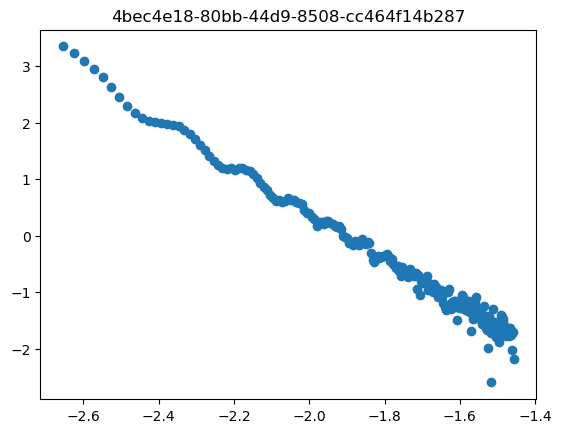

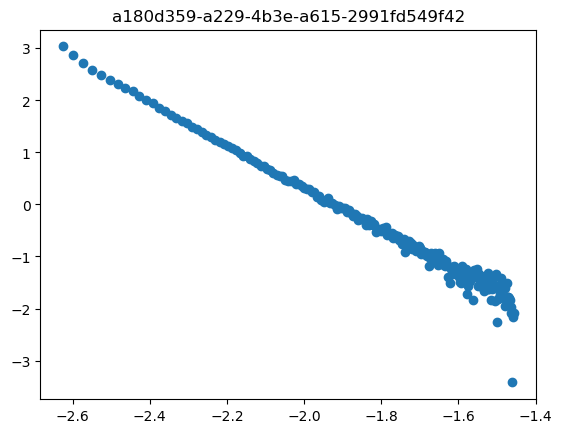

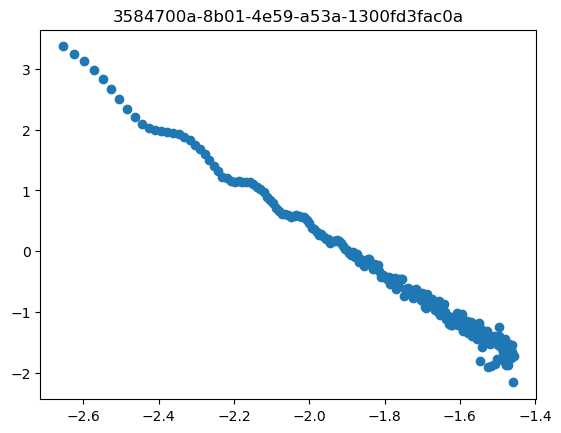

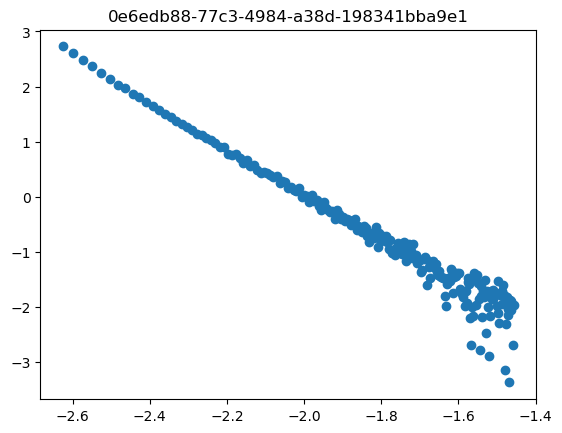

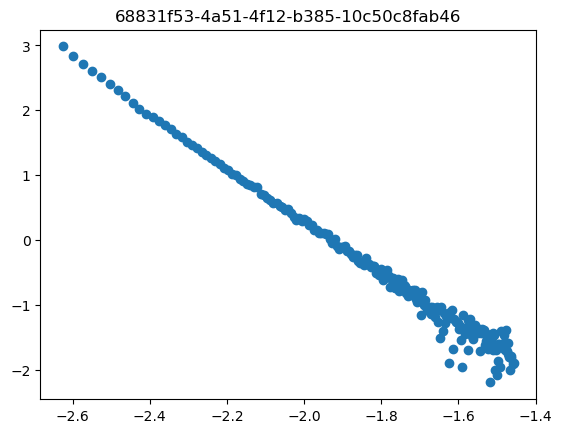

...

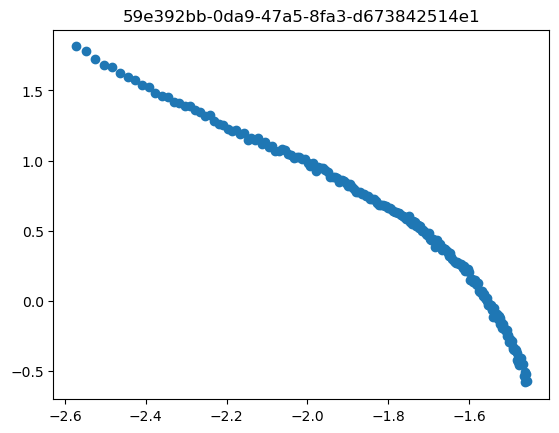

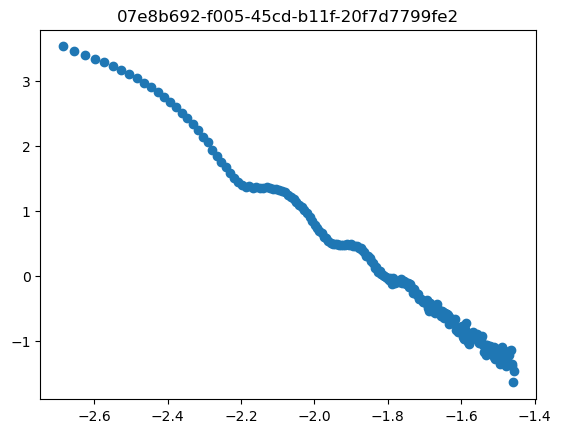

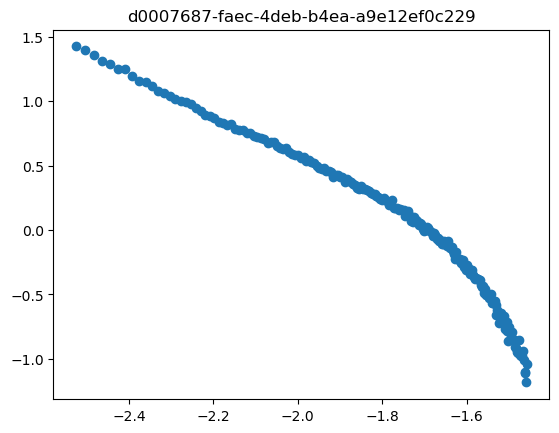

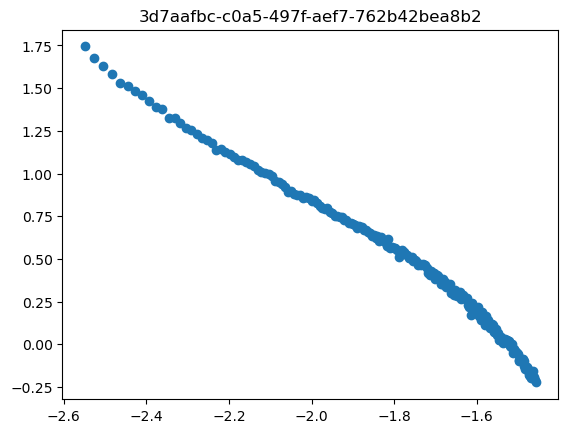

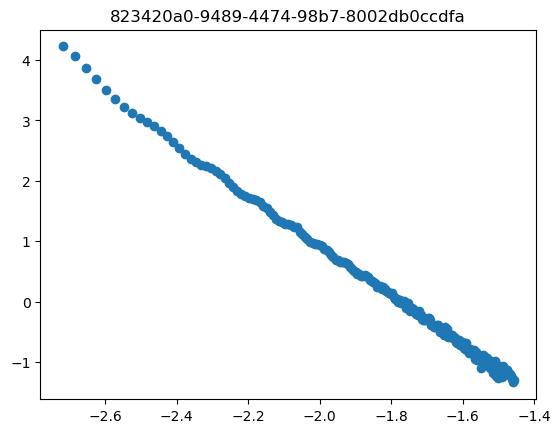

In [14]:
for uuid_val, entry in processing_dataset.items():
    print(uuid_val)
    try:
        status = entry['status']
        if status == 'failed':
            print('failed at ', entry['failure_point'])
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']
    
        ax.scatter(q, I_subtracted)
        ax.set_title(uuid_val)

## Sanity check spline fit

/tmp/ipykernel_16283/3859189070.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


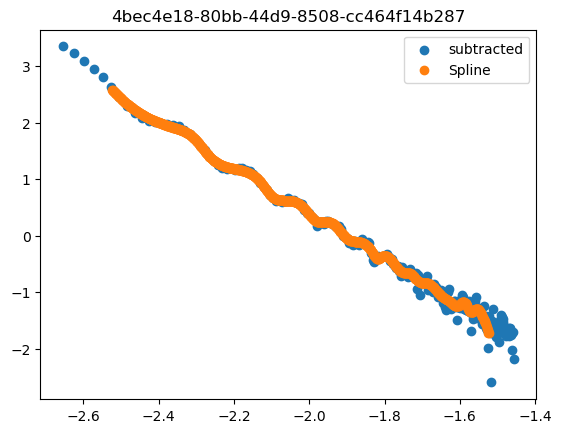

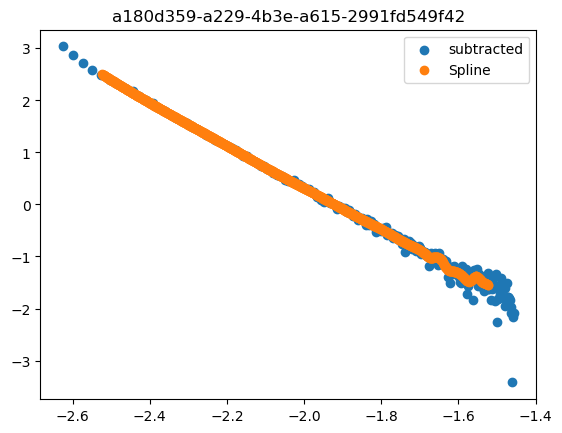

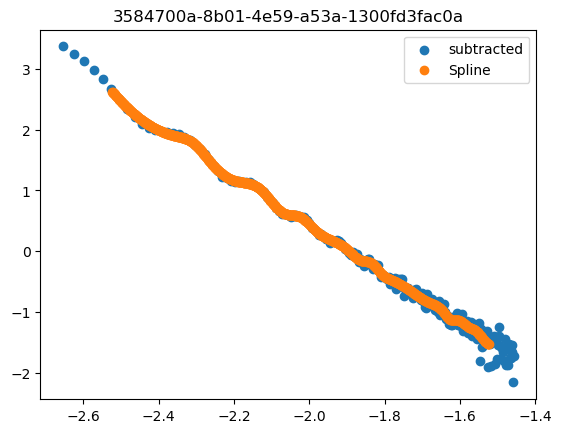

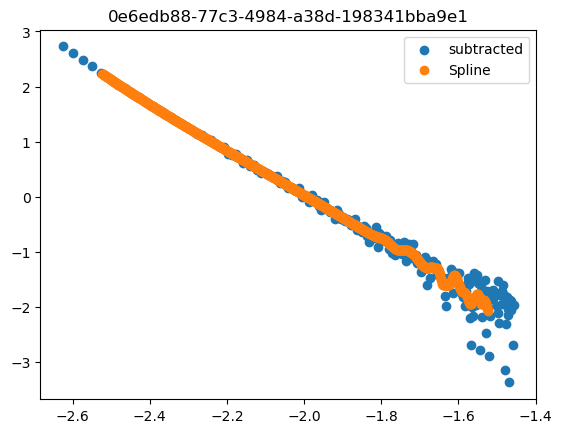

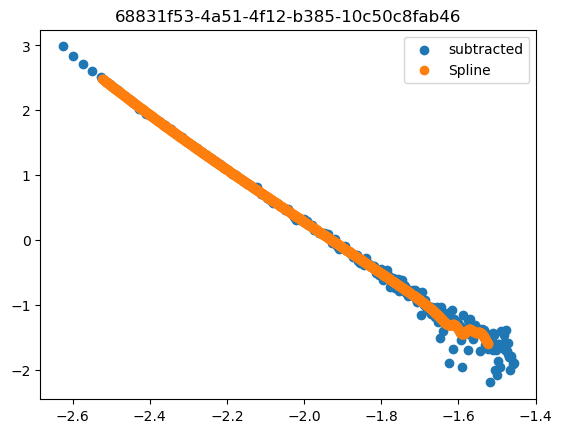

...

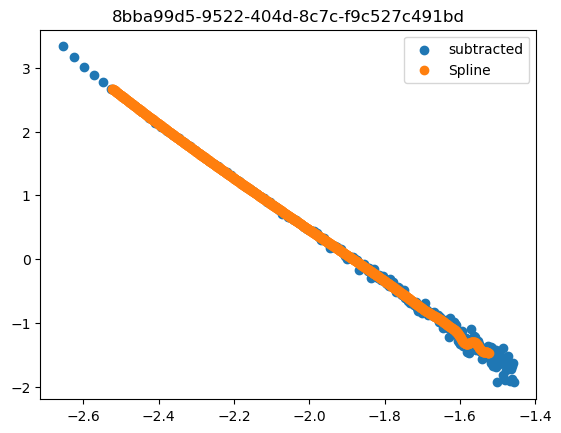

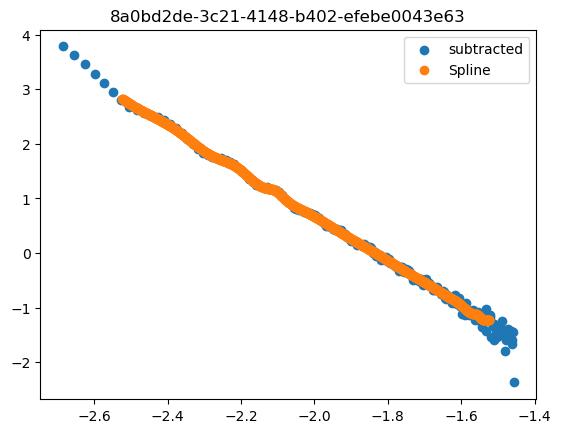

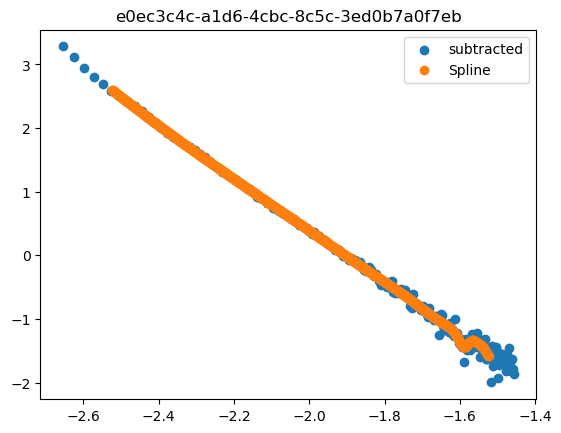

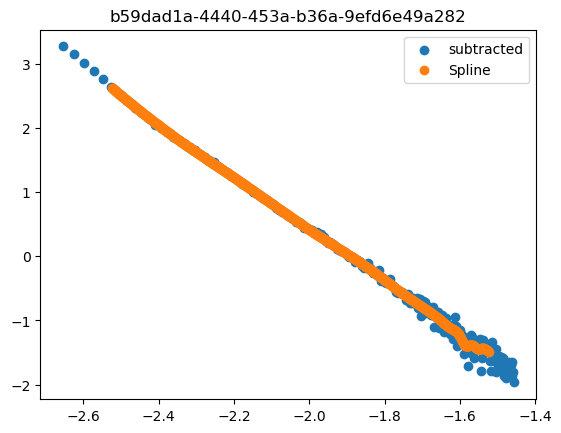

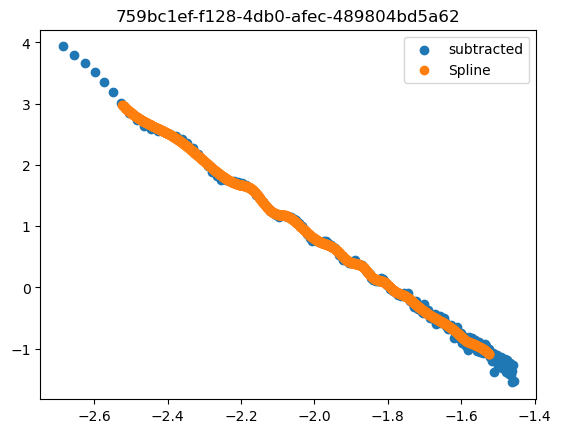

In [13]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']

        I_spline = entry['I_spline']
        
    
        ax.scatter(q, I_subtracted, label = 'subtracted')
        ax.scatter(q_grid, I_spline, label = 'Spline')
        ax.legend()
        ax.set_title(uuid_val)

## Sanity check scaling

/tmp/ipykernel_975/1900914898.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


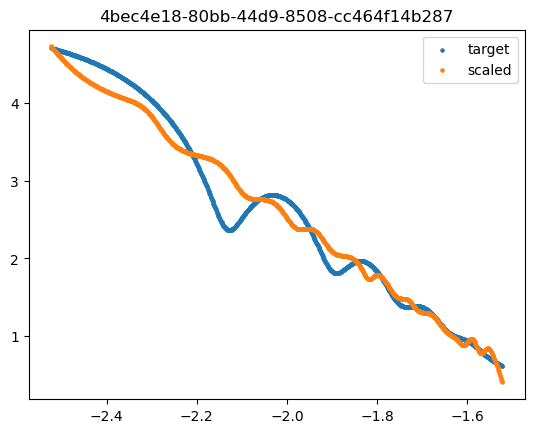

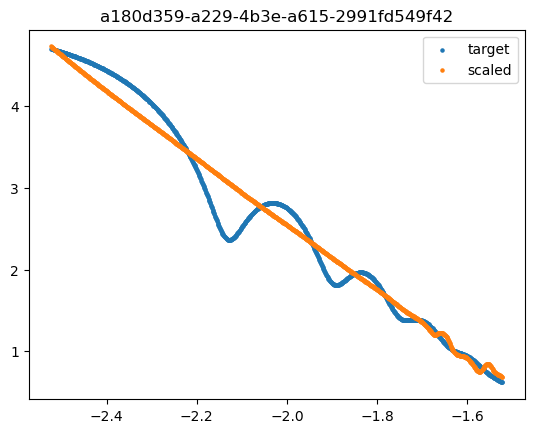

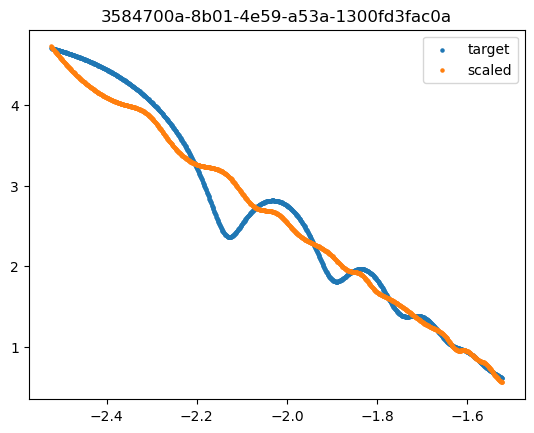

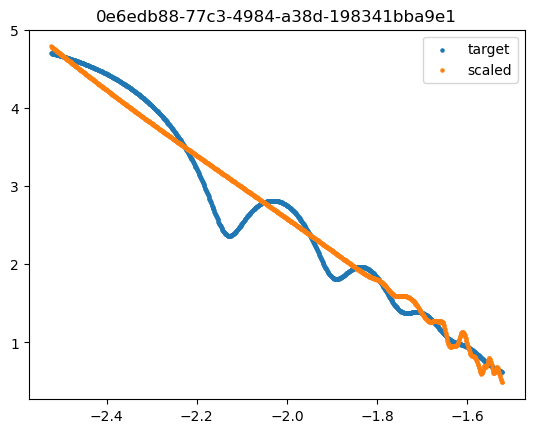

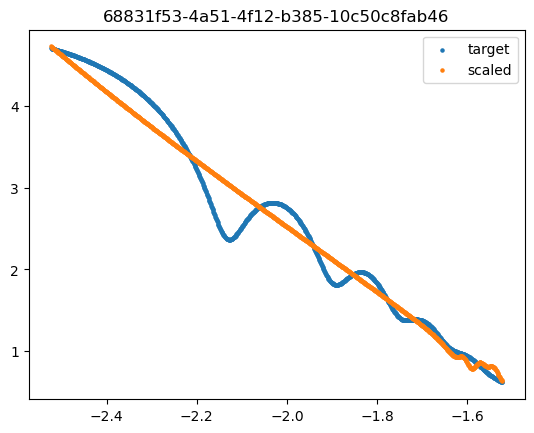

...

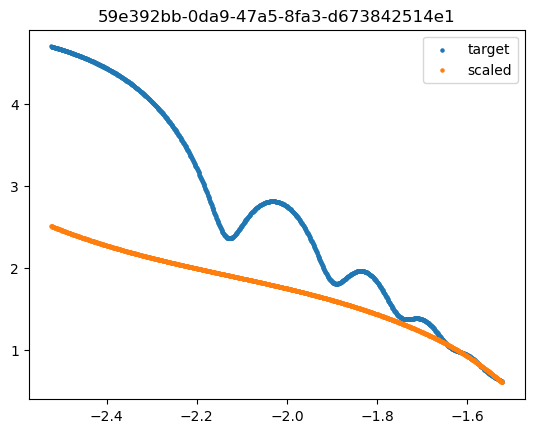

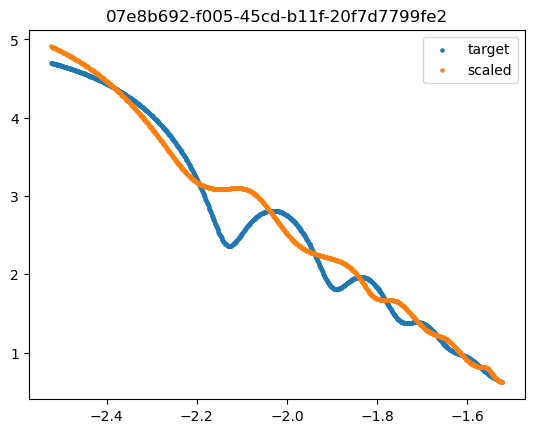

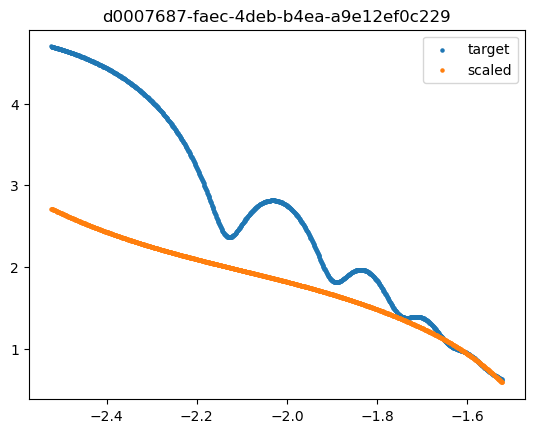

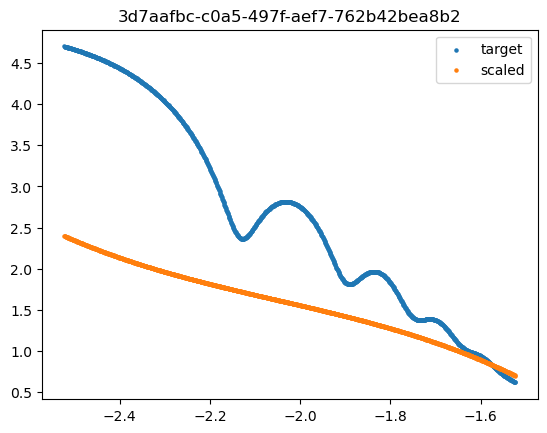

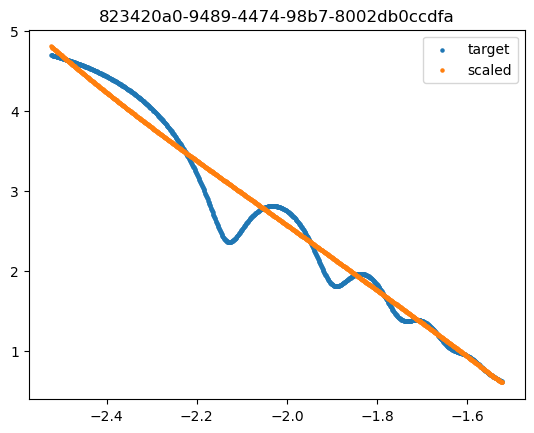

In [15]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()


        I_scaled = entry['I_scaled']
        
    
        ax.scatter(q_grid, target_I, label = 'target', s = 5)
        ax.scatter(q_grid, I_scaled, label = 'scaled', s = 5)
        ax.legend()
        ax.set_title(uuid_val)

## Fit sphere model

In [16]:
for uuid_val, entry in processing_dataset.items():
    try:
        subtracted = entry['subtracted_clipped']
    except KeyError:
        continue
        
    data_sas = io.df_to_sasdata(subtracted)
    results, result_obj, problem  = sasview_fitting.fit_sphere(data_sas, polydispersity=True)

    processing_dataset[uuid_val]['sphere_fit_results'] = results
    processing_dataset[uuid_val]['sphere_fit_problem'] = problem

In [17]:
diameters = {}
pdi_vals = {}

for uuid_val, entry in processing_dataset.items():
    try:
        sphere_results = entry['sphere_fit_results']
        d = sphere_results['radius']*2/10
        pdi = sphere_results['radius_pd']
        diameters[uuid_val] = d
        pdi_vals[uuid_val] = pdi
    except KeyError:
        continue

## sanity check fit results

/tmp/ipykernel_975/2583699091.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


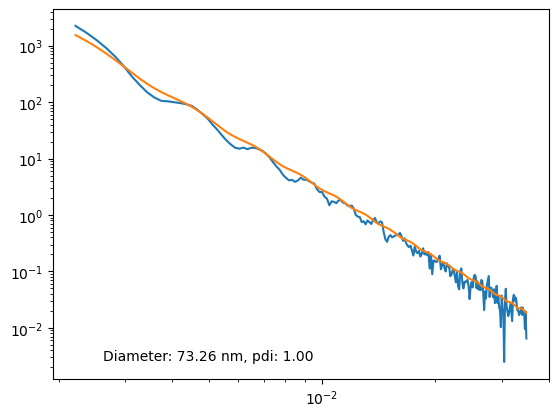

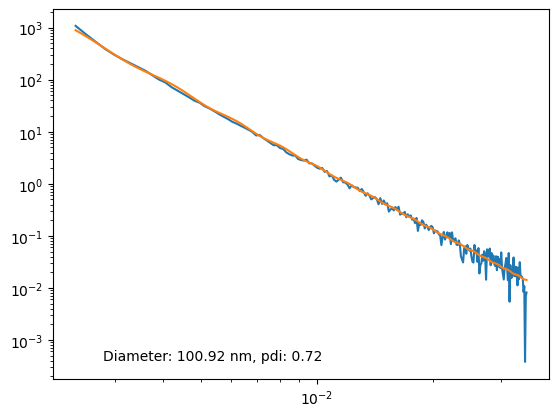

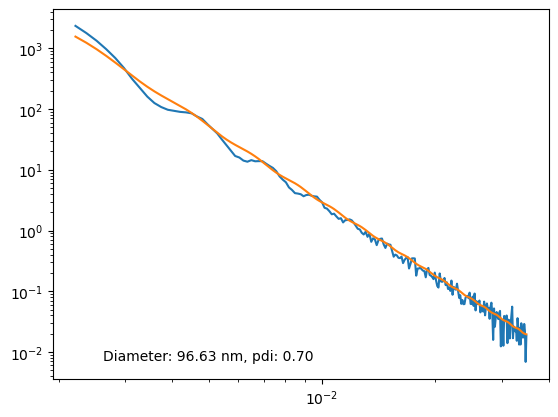

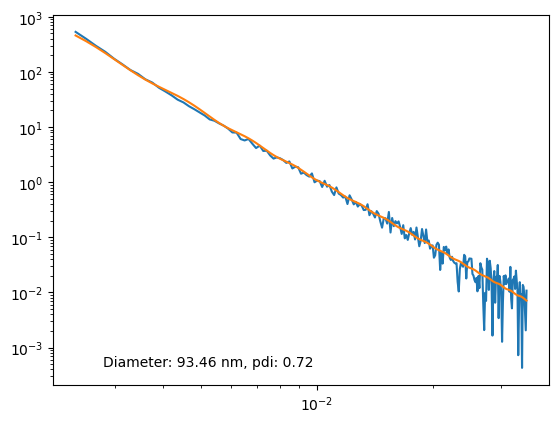

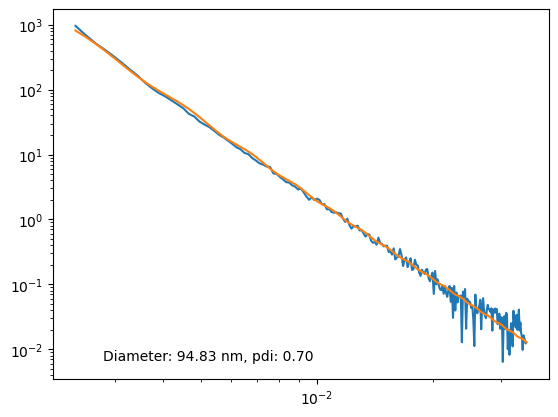

...

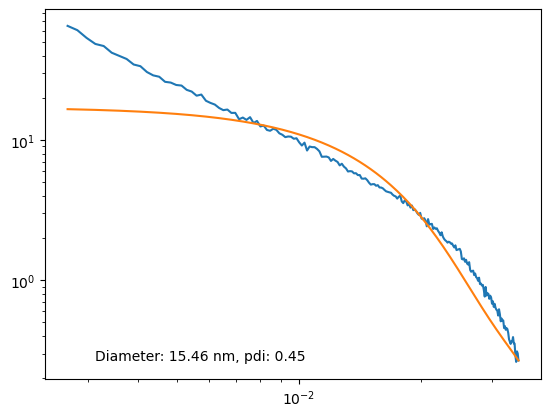

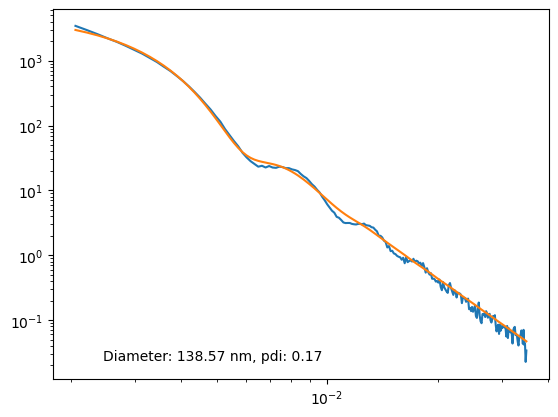

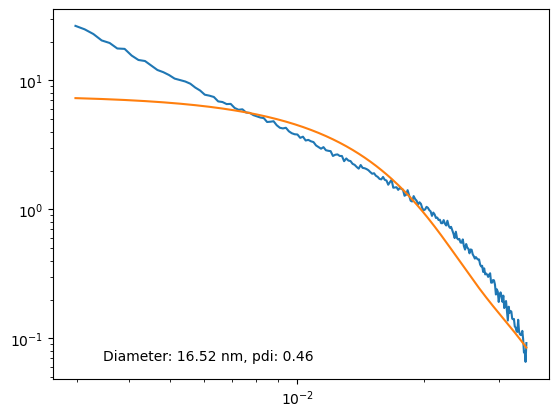

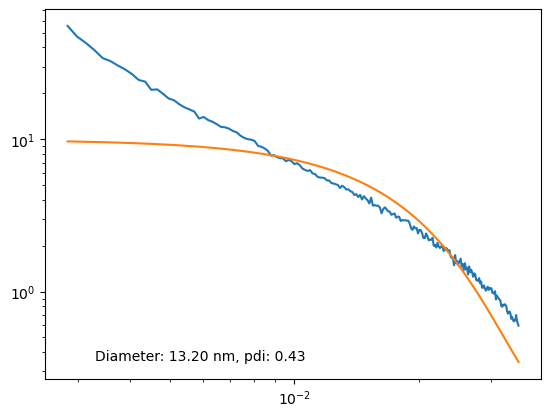

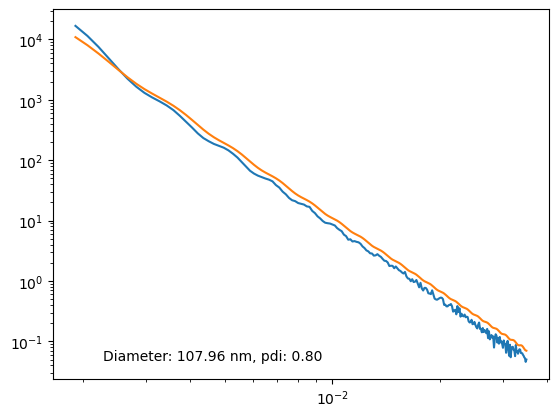

In [19]:
for uuid_val, entry in processing_dataset.items():
    try:
        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']
    
        problem = entry['sphere_fit_problem']
    except KeyError:
        continue


    data = problem.fitness._data
    Icalc = problem.fitness.Iq_calc

    fig, ax = plt.subplots()

    ax.loglog(data.x, data.y, label = 'measured')
    ax.loglog(data.x, Icalc, label = 'fit')
    ax.text(0.1, 0.05, f'Diameter: {sphere_d:.2f} nm, pdi: {sphere_pdi:.2f}', transform = ax.transAxes)

## Plot final ranked order of best samples

In [20]:
sum_ap = {}
for uuid_val, entry in processing_dataset.items():
    try:
        
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
            
    except KeyError:
        sum_ap[uuid_val] = entry['ap_sum_distance']


uuids = np.array(list(sum_ap.keys()))
rmses = list(sum_ap.values())
uuid_sorted_sum = uuids[np.argsort(rmses)]

In [21]:

with PdfPages('ranked_apdist_results.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_sum):

        entry  = processing_dataset[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = sum_ap[uuid_val]

        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']


    
        fig, ax = plt.subplots()
        ax.loglog(10**q_grid, 10**target_I, label = 'target')
        ax.loglog(10**q_grid, 10**I_scaled, label = 'measured')
        ax.set_xlabel('q [1/A]')
        ax.set_title(uuid_val)
        ax.text(0.1, 0.1, f'Rank: {i}\nsum distance: {distance:.2f}\nsphere diameter: {sphere_d:.2f} nm\nsphere pdi: {sphere_pdi:.2f}', transform = ax.transAxes)
        ax.legend()
        pdf.savefig()
        plt.close()

## Plot raw RMSE

In [22]:
raw_rmse = {}
for uuid_val, entry in processing_dataset.items():
    try:
        
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
            
    except KeyError:
        raw_rmse[uuid_val] = entry['rmse_raw']


uuids = np.array(list(raw_rmse.keys()))
rmses = list(raw_rmse.values())
uuid_sorted_rmseraw = uuids[np.argsort(rmses)]

In [23]:
with PdfPages('ranked_rawrmse_results.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_rmseraw):

        entry  = processing_dataset[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = raw_rmse[uuid_val]

        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']


    
        fig, ax = plt.subplots()
        ax.loglog(10**q_grid, 10**target_I, label = 'target')
        ax.loglog(10**q_grid, 10**I_scaled, label = 'measured')
        ax.set_xlabel('q [1/A]')
        ax.set_title(uuid_val)
        ax.text(0.1, 0.1, f'Rank: {i}\nrmse_raw distance: {distance:.2f}\nsphere diameter: {sphere_d:.2f} nm\nsphere pdi: {sphere_pdi:.2f}', transform = ax.transAxes)
        ax.legend()
        pdf.savefig()
        plt.close()

## Write results to disk

In [24]:
uuid_vals = []
amplitude = []
phase = []
sum_ap = []
raw_rmse = []
statuses = []
sphere_diameter = []
sphere_pdi = []

for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            uuid_vals.append(uuid_val)
            amplitude.append(None)
            phase.append(None)
            sum_ap.append(None)
            statuses.append('failed')
            sphere_diameter.append(None)
            sphere_pdi.append(None)
            raw_rmse.append(None)
            continue
        else:
            raise KeyError
    except KeyError:
        uuid_vals.append(uuid_val)
        amplitude.append(entry['amplitude_distance'])
        phase.append(entry['phase_distance'])
        sum_ap.append(entry['ap_sum_distance'])
        raw_rmse.append(entry['rmse_raw'])
        statuses.append('success')
        sphere_diameter.append(entry['sphere_fit_results']['radius']*2/10)
        sphere_pdi.append(entry['sphere_fit_results']['radius_pd'])
    

In [25]:
results_df = pd.DataFrame({'uuid':uuid_vals, 'amplitude_distance':amplitude, 'phase_distance':phase, 'sum_ap_distance':sum_ap, 'raw_rmse_distance':raw_rmse, 'sphere_diameter_nm':sphere_diameter, 'sphere_pdi':sphere_pdi, 'processes_status':statuses})

In [26]:
results_df.to_csv('distance_results_comparisonOptRound1.csv')

In [27]:
results_df

,uuid,amplitude_distance,phase_distance,sum_ap_distance,raw_rmse_distance,sphere_diameter_nm,sphere_pdi,processes_status
0,4bec4e18-80bb-44d9-8508-cc464f14b287,0.722325,0.567682,1.290007,0.234224,73.262381,1.000000,success
1,a180d359-a229-4b3e-a615-2991fd549f42,1.035157,0.515580,1.550737,0.226918,100.922977,0.722970,success
2,3584700a-8b01-4e59-a53a-1300fd3fac0a,0.918022,0.467817,1.385839,0.240399,96.631829,0.704364,success
3,0e6edb88-77c3-4984-a38d-198341bba9e1,0.932813,0.572014,1.504827,0.232926,93.463489,0.718000,success
4,68831f53-4a51-4f12-b385-10c50c8fab46,1.091741,0.541297,1.633039,0.227138,94.828557,0.695253,success
...,...,...,...,...,...,...,...,...
117,d0007687-faec-4deb-b4ea-a9e12ef0c229,1.199332,0.502743,1.702075,1.129595,16.519831,0.464380,success
118,8ba0c6b7-3832-481e-bb23-e1c1513e39da,NaN,NaN,NaN,NaN,NaN,NaN,failed
119,3d7aafbc-c0a5-497f-aef7-762b42bea8b2,1.279936,0.480092,1.760028,1.345274,13.195812,0.429406,success
120,823420a0-9489-4474-98b7-8002db0ccdfa,1.037086,0.440450,1.477537,0.225884,107.955490,0.801460,success
